<a href="https://colab.research.google.com/github/kug4586/test_scoring/blob/main/1_cut_paper.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1. 사진 속 종이 잘라내기

## 0. 계획

I. 이미지 분할(image segmentation)이란?
- 합성곱 신경망(Convolution Neural Network)
- RCNN, Fast-RCNN, Faster-RCNN, Mask-RCNN

II. 구현할 방법 찾기 : 기존 모델 vs 수제 모델
- 기존 모델 win

III. 데이터셋 제작

IV. 모델 훈련 & 테스트

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
%cd /content/drive/MyDrive/Colab_Notebooks/test_scoring/1_cut_paper

/content/drive/MyDrive/Colab_Notebooks/test_scoring/1_cut_paper


## 1. 데이터셋

일단 아래 링크를 참고해서

[참고](https://velog.io/@nayeon_p00/%EC%A2%85%EC%9D%B4-%EC%8B%9C%ED%97%98%EC%A7%80-%EC%9E%90%EB%8F%99-%EC%B1%84%EC%A0%90-%ED%94%84%EB%A1%9C%EA%B7%B8%EB%9E%A8-Image-Segmentation-Mask-R-CNN-Ch2.-%EC%9D%B4%EB%AF%B8%EC%A7%80%EC%97%90%EC%84%9C-%EB%B0%B0%EA%B2%BD-%EC%9E%90%EB%A5%B4%EA%B8%B0)

[참고(github)](https://github.com/Nayeon12/Scoring-Paper-Tests-with-RCNN/tree/main/data/images_segmentation)

In [ ]:
!git clone https://github.com/Nayeon12/Scoring-Paper-Tests-with-RCNN.git

fatal: destination path 'Scoring-Paper-Tests-with-RCNN' already exists and is not an empty directory.


## 2. 모델 로드 & 학습 & 예측

### (1) Detectron2 & torchvision 설치

Detectron2 : 페이스북 연구소(facebook-research)에서 만듦

In [ ]:
# 모듈 확인 (torch, torchvision, pyyaml, detectron2)
!pip list

In [ ]:
# 모듈 pyyaml 설치
!pip install pyyaml==5.1

     |████████████████████████████████| 274 kB 7.7 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=4e92a10e19500ed5e75bb41975c38a318c3861ed4242d90c6b5211426ecefc40
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [ ]:
# detectron2 설치 (재시작 필요)
!pip install git+https://github.com/facebookresearch/detectron2

  Cloning https://github.com/facebookresearch/detectron2 to /tmp/pip-req-build-g8oga93s
  Running command git clone -q https://github.com/facebookresearch/detectron2 /tmp/pip-req-build-g8oga93s
     |████████████████████████████████| 50 kB 2.1 MB/s 
     |████████████████████████████████| 78 kB 8.5 MB/s 
     |████████████████████████████████| 151 kB 52.7 MB/s 
     |████████████████████████████████| 130 kB 62.0 MB/s 
     |████████████████████████████████| 38.1 MB 1.4 MB/s 
     |████████████████████████████████| 749 kB 60.9 MB/s 
     |████████████████████████████████| 843 kB 60.7 MB/s 
     |████████████████████████████████| 117 kB 79.5 MB/s 
  Created wheel for detectron2: filename=detectron2-0.6-cp37-cp37m-linux_x86_64.whl size=5283285 sha256=4f982be07e47df938a0091a19c497e9946d235a791f26471a66e58632fc8b939
  Stored in directory: /tmp/pip-ephem-wheel-cache-n2wdjp3d/wheels/03/77/a6/fa1478f50bed45b5c4173ef6308b167be7521e7267751b6f31
  Created wheel for fvcore: filename=fvcore-0.1.5.p

In [ ]:
%cd /content/drive/MyDrive/Colab_Notebooks/test_scoring/1_cut_paper

import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

import matplotlib.pyplot as plt
import numpy as np
import cv2, os, json, random
from google.colab.patches import cv2_imshow

from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

/content/drive/MyDrive/Colab_Notebooks/test_scoring/1_cut_paper


### (2) 인식할 객체 추가

COCO 데이터셋에 【test_paper】객체 추가

* labelme 모듈 : 이미지 파일을 라벨링해서 json 파일로 저장해줌

  코랩이 아닌 컴퓨터에서 실행하고 올것

  [참고 1](https://blog.naver.com/PostView.nhn?blogId=synviva&logNo=221816792351)

  [참고 2](https://hansonminlearning.tistory.com/52)

  [참고 3](https://www.youtube.com/watch?v=ElAVLYaVWgk&t=472s)

In [ ]:
# coco 데이터셋에 test-paper 객체instance를 추가
from detectron2.structures import BoxMode

def get_data_dicts(dir):
  dataset_dicts = []
  for idx, file_name in enumerate([file for file in os.listdir(dir) if file.endswith('.json')]):
    json_file = os.path.join(dir, file_name)
    with open(json_file) as f:
      img_anns = json.load(f)

    record = {}

    file_name = os.path.join(dir, img_anns['imagePath'])
    height, width = cv2.imread(file_name).shape[:2]
    

    record['file_name'] = file_name
    record["image_id"] = idx
    record['height'] = height
    record['width'] = width

    annos = img_anns['shapes']
    objs = []
    for anno in annos:
      px = [a[0] for a in anno['points']]
      py = [a[1] for a in anno['points']]
      poly = [(x,y) for x,y in zip(px,py)]
      poly = [p for x in poly for p in x]

      obj = {
          "bbox": [np.min(px), np.min(py), np.max(px), np.max(py)],
          "bbox_mode": BoxMode.XYXY_ABS,
          "segmentation": [poly],
          "category_id": 0,
      }
      objs.append(obj)
    record['annotations'] = objs
    dataset_dicts.append(record)
  return dataset_dicts

for d in ["train", "test"]:
    DatasetCatalog.register("test_paper_" + d, lambda d=d: get_data_dicts('data/' + d))
    MetadataCatalog.get("test_paper_" + d).set(thing_classes=['test_paper'])
test_paper_metadata = MetadataCatalog.get("test_paper_train")

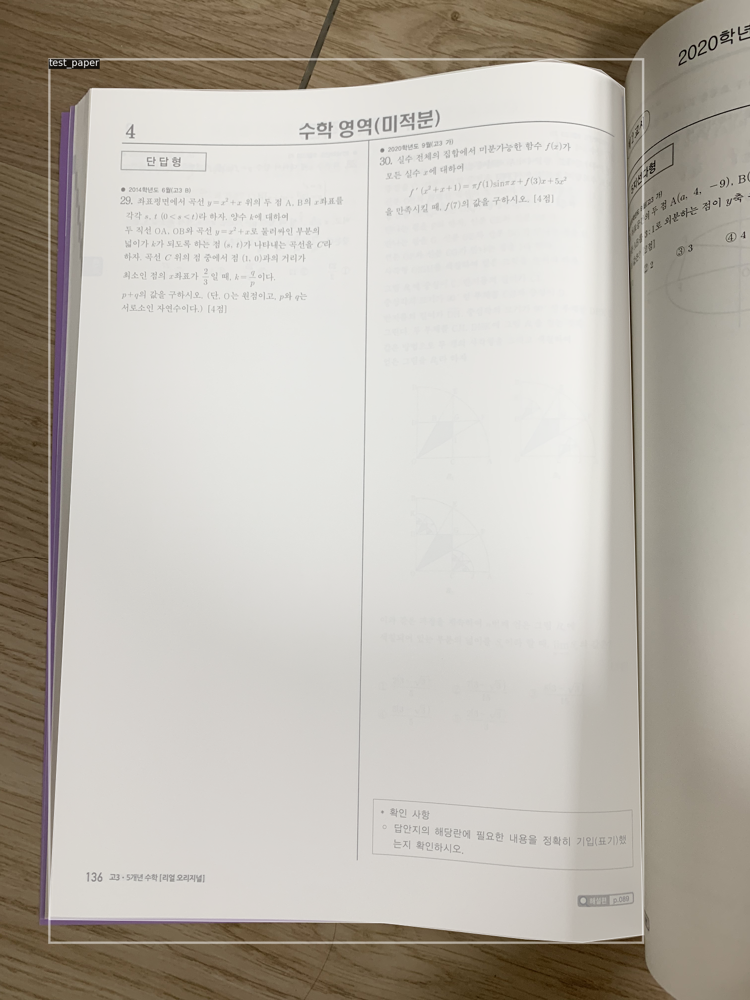

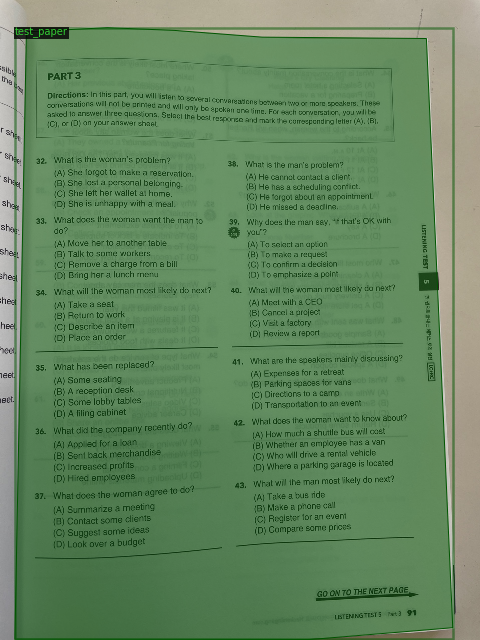

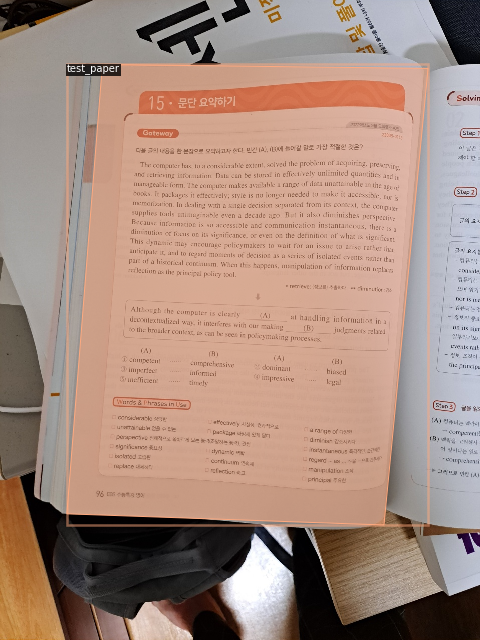

In [ ]:
# 훈련 데이터 시각화
dataset_dicts = get_data_dicts("data/train")
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=test_paper_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

### (3) 모델 재훈련

In [ ]:
# 모델 정의
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file('COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml'))
cfg.DATASETS.TRAIN = ("test_paper_train",)
cfg.DATASETS.TEST = () 
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.02
cfg.SOLVER.MAX_ITER = 300 
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1

In [ ]:
# 모델 훈련
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

### (4) 모델 확인

In [ ]:
# 텐서보드로 훈련 결과 출력
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/Colab_Notebooks/test_scoring/1_cut_paper/output

<IPython.core.display.Javascript object>

In [ ]:
# 훈련된 가중치로 예측기 만들기
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7
cfg.DATASETS.TEST = ("test_paper_test", )
predictor = DefaultPredictor(cfg)

[05/19 14:33:31 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                                  | Shapes                                          |
|:------------------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*               | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.bottom_up.res2.0.conv2.*               | backbone.bottom_up.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| backbone.bottom_up.res2.0.conv3.*               | backbone.bottom_up.res2.0.conv3.{norm.bia

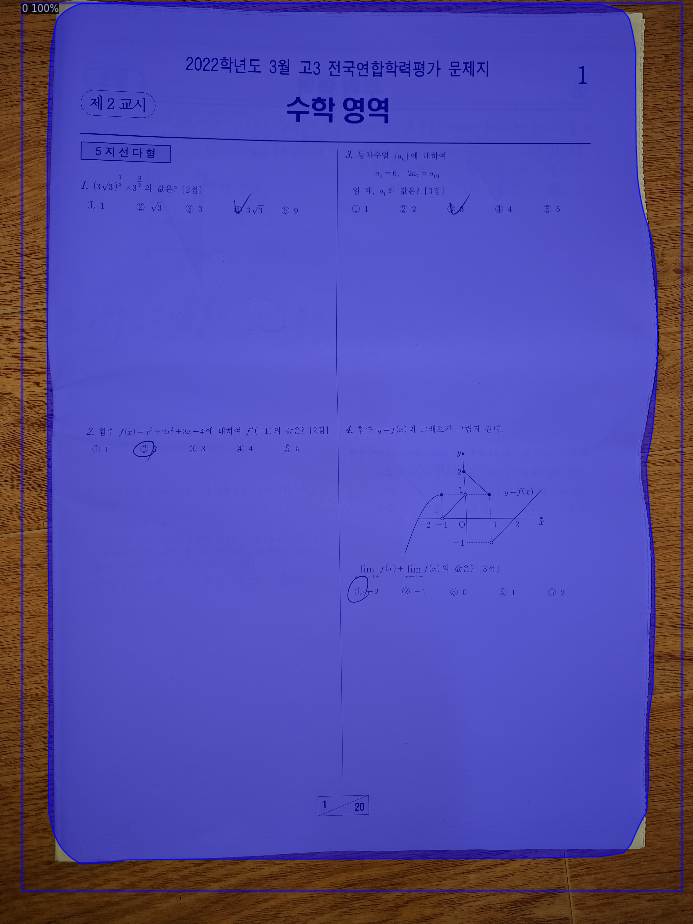

In [ ]:
# 예측 & 시각화
path = '/content/drive/MyDrive/Img/20220411_201651.jpg'

im = cv2.imread(path)
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=0.2)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])

## 3. cutting segmetation mask (분할된 부분 자르기)

In [ ]:
import matplotlib.pyplot as plt

ins = outputs["instances"]

pred_masks = ins.get_fields()["pred_masks"]
boxes = ins.get_fields()["pred_boxes"]

print(pred_masks)
print(pred_masks.size())
print(boxes)

tensor([[[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False]]], device='cuda:0')
torch.Size([1, 4624, 3468])
Boxes(tensor([[ 110.1469,   20.1415, 3410.7148, 4458.9204]], device='cuda:0'))


In [ ]:
import tensorflow as tf
import numpy as np
from PIL import Image

## 텐서 객체를 넘파이 배열로 변환
mask_array = pred_masks.cpu().numpy()

## 넘파이 배열을 이미지로 변환
mask = Image.fromarray(mask_array[0])

# 이미지 저장
mask.save("/content/drive/MyDrive/Colab_Notebooks/test_scoring/1_cut_paper/segmented_area.jpg")

In [ ]:
img = cv2.imread("/content/drive/MyDrive/Colab_Notebooks/test_scoring/1_cut_paper/segmented_area.jpg")

# 이 과정이 없으면, 시각화할 때 분할된 부분이 사라진다.
img = 255-img

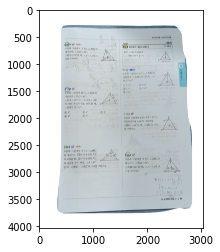

In [ ]:
from skimage.segmentation import clear_border
import skimage.morphology as mp
import scipy.ndimage.morphology as sm

## bitwise_or
img = (img*1).astype('uint8')
masked = cv2.bitwise_or(img, im)

plt.imshow(masked)
# numpy to image
masked = Image.fromarray(masked, 'RGB')
masked.save("/content/drive/MyDrive/Colab_Notebooks/test_scoring/1_cut_paper/masked_img.jpg")

## 4. 잘라낸 이미지의 관점 일반화

* 삐딱하거나 기울어진 이미지를 직사각형 모양의 이미지로 변환

### (1) 테두리 좌표 조사

예측 결과가 담긴 배열에서 '종이'가 있는 위치는 True로, 아니면 False로 저장되있다.

In [ ]:
pred_masks.size()

torch.Size([1, 4624, 3468])

In [ ]:
from matplotlib import pyplot as plt
import numpy as np

# A / B 행렬에 넣기
upA = np.empty((0,2), int)
upB = np.array([])
rightA = np.empty((0,2), int)
rightB = np.array([])
leftA = np.empty((0,2), int)
leftB = np.array([])
downA = np.empty((0,2), int)
downB = np.array([])


# index
true_indexes = []
for i in range(pred_masks.size()[2]):
  H_arr = []
  for j in range(pred_masks.size()[1]):
    if mask_array[i,j] == True:
      H_arr.append((i,j))
  if len(H_arr) > 0:
    true_indexes.append(H_arr)

In [ ]:
print(true_indexes[0])

[(633, 1720), (633, 1721), (633, 1722), (633, 1723), (633, 1724), (633, 1725), (633, 1726), (633, 1727), (633, 1728), (633, 1729), (633, 1730), (633, 1731), (633, 1732), (633, 1733), (633, 1734), (633, 1735), (633, 1736), (633, 1737), (633, 1738), (633, 1739), (633, 1740), (633, 1741), (633, 1742), (633, 1743), (633, 1744), (633, 1745), (633, 1746), (633, 1747), (633, 1748), (633, 1749), (633, 1750), (633, 1751), (633, 1752), (633, 1753), (633, 1754), (633, 1755), (633, 1756), (633, 1757), (633, 1758), (633, 1759), (633, 1760), (633, 1761), (633, 1762), (633, 1763), (633, 1764), (633, 1765), (633, 1766), (633, 1767), (633, 1768), (633, 1769), (633, 1770), (633, 1771), (633, 1772), (633, 1773), (633, 1774), (633, 1775), (633, 1776), (633, 1777), (633, 1778), (633, 1779), (633, 1780), (633, 1781), (633, 1782), (633, 1783), (633, 1784), (633, 1785), (633, 1786), (633, 1787), (633, 1788), (633, 1789), (633, 1790), (633, 1791), (633, 1792), (633, 1793), (633, 1794), (633, 1795), (633, 1796)

In [ ]:
from matplotlib import pyplot as plt
import numpy as np

# A / B 행렬에 넣기
upA = np.empty((0,2), int)
upB = np.array([])
rightA = np.empty((0,2), int)
rightB = np.array([])
leftA = np.empty((0,2), int)
leftB = np.array([])
downA = np.empty((0,2), int)
downB = np.array([])

# 시각화를 위한 배열
# (필요 없으면 주석 처리)
uplistx = []
uplisty = []
rightlistx = []
rightlisty = []
leftlistx = []
leftlisty = []
downlistx = []
downlisty = []
totalx = []
totaly = []

for i in range(0, pred_masks.size()[1],2):
  for j in range(0, pred_masks.size()[2],2):

    # 만약 '종이'가 있는 위치라면
    if(pred_masks[0][i][j] == True):

      up = pred_masks[0][i-1][j]
      down = pred_masks[0][i+1][j]
      right = pred_masks[0][i][j+1]
      left = pred_masks[0][i][j-1]

      # 만약 '종이'가 위엔 없고 아래에는 있다면
      if (up == False and down == True):
        # ?
        if(len(upA) == 0 or upA[-1][0] == j):
          upA = np.append(upA, np.array([[j, 1]]), axis=0)
          upB = np.append(upB, np.array([i]))
          uplistx.append(j)
          uplisty.append(i)
          totalx.append(j)
          totaly.append(i)
          continue

        # ?
        if(abs((upB[-1] - i) / (upA[-1][0] - j)) < 3):
          upA = np.append(upA, np.array([[j, 1]]), axis=0)
          upB = np.append(upB, np.array([i]))
          uplistx.append(j)
          uplisty.append(i)
          totalx.append(j)
          totaly.append(i)

          # ?
          if(len(upA) == 1):
            upA.pop(0)
            upB.pop(0)

      # 만약 '종이'가 오른쪽엔 없고 왼쪽엔 있다면
      elif (right == False and left == True):
        # ?
        if(len(rightA) == 0 or rightA[-1][0] == j):
          rightA = np.append(rightA, np.array([[j, 1]]), axis=0)
          rightB = np.append(rightB, np.array([i]))
          rightlistx.append(j)
          rightlisty.append(i)
          totalx.append(j)
          totaly.append(i)
          continue

        # ?
        if(abs((rightB[-1] - i )/ (rightA[-1][0] - j)) > 6):
          rightA = np.append(rightA, np.array([[j, 1]]), axis=0)
          rightB = np.append(rightB, np.array([i]))
          rightlistx.append(j)
          rightlisty.append(i)
          totalx.append(j)
          totaly.append(i)
          
          # ?
          if(len(rightA) == 1):
            rightA.pop(0)
            rightB.pop(0)
        
      # 만약 '종이'가 왼쪽엔 없고 오른쪽엔 있다면
      elif (left == False and right == True):
        # ?
        if(len(leftA) == 0 or leftA[-1][0] == j):
          leftA = np.append(leftA, np.array([[j, 1]]), axis=0)
          leftB = np.append(leftB, np.array([i]))
          leftlistx.append(j)
          leftlisty.append(i)
          totalx.append(j)
          totaly.append(i)
          continue
        
        # ?
        if(abs((leftB[-1] - i )/ (leftA[-1][0] - j)) > 6):
          leftA = np.append(leftA, np.array([[j, 1]]), axis=0)
          leftB = np.append(leftB, np.array([i]))
          leftlistx.append(j)
          leftlisty.append(i)
          totalx.append(j)
          totaly.append(i)

          # ?
          if (len(leftA) == 1):
            leftA.pop(0)
            leftB.pop(0)

      # 만약 '종이'가 아래엔 없고 위엔 있다면
      elif (down == False and up == True):
        # ?
        if(len(downB) == 0 or downA[-1][0] == j):
          downA = np.append(downA, np.array([[j, 1]]), axis=0)
          downB = np.append(downB, np.array([i]))
          downlistx.append(j)
          downlisty.append(i)
          totalx.append(j)
          totaly.append(i)
          continue
        
        # ?
        if(abs((downB[-1] - i )/ (downA[-1][0] - j)) < 3):
          downA = np.append(downA, np.array([[j, 1]]), axis=0)
          downB = np.append(downB, np.array([i]))
          downlistx.append(j)
          downlisty.append(i)
          totalx.append(j)
          totaly.append(i)

          # ?
          if(len(downA) == 1):
            downA.pop(0)
            downB.pop(0)

/bin/bash: -c: line 0: syntax error near unexpected token `totalx,'
/bin/bash: -c: line 0: `plt.scatter(totalx, totaly)'


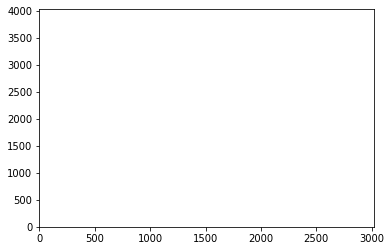

In [ ]:
!plt.scatter(totalx, totaly)
plt.xlim([0, 3024])
plt.ylim([0, 4032])
plt.show()

### (2) 네 변의 직선의 방정식 구하기

최소제곱법을 이용하여 직선의 기울기와 Y절편으로 직선의 방정식을 규정함

In [ ]:
# 기울기 & Y절편
import numpy.linalg as lin
X_up = np.linalg.inv(upA.T.dot(upA)).dot(upA.T).dot(upB)
X_right = np.linalg.inv(rightA.T.dot(rightA)).dot(rightA.T).dot(rightB)
X_left = np.linalg.inv(leftA.T.dot(leftA)).dot(leftA.T).dot(leftB)
X_down = np.linalg.inv(downA.T.dot(downA)).dot(downA.T).dot(downB)

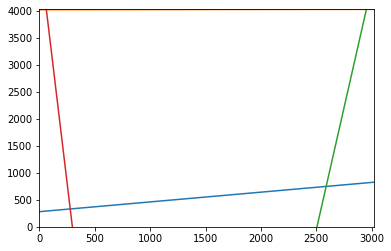

In [ ]:
x = np.arange(0, 3024, 1)
y1 = [X_up[0] * num + X_up[1] for num in x]
y2 = [X_down[0] * num + X_down[1] for num in x]
y3 = [X_right[0] * num + X_right[1] for num in x]
y4 = [X_left[0] * num + X_left[1] for num in x]

plt.plot(x, y1)
plt.plot(x, y2)
plt.plot(x, y3)
plt.plot(x, y4)
plt.xlim([0, 3024])
plt.ylim([0, 4032])
plt.show()

### (3) 꼭짓점의 좌표 구하기

두 직선의 방정식을 연립하여 교점을 구함

In [ ]:
# 좌측상단의 꼭짓점
upandleftA = np.array([[-X_up[0], 1], [-X_left[0], 1]])
upandleftB = np.array([X_up[1], X_left[1]])
itpoint_1 = np.linalg.solve(upandleftA,upandleftB)

if(itpoint_1[0] < 0):
  itpoint_1[0] = 0
if(itpoint_1[1] < 0):
  itpoint_1[1] = 0

# 우측상단의 꼭짓점
upandrightA = np.array([[-X_up[0], 1], [-X_right[0], 1]])
upandrightB = np.array([X_up[1], X_right[1]])
itpoint_2 = np.linalg.solve(upandrightA,upandrightB)

if(itpoint_2[0] > pred_masks.size()[2]):
  itpoint_2[0] = pred_masks.size()[2]
if(itpoint_2[1] < 0):
  itpoint_2[1] = 0

# 좌측하단의 꼭짓점
downandleftA = np.array([[-X_down[0], 1], [-X_left[0], 1]])
downandleftB = np.array([X_down[1], X_left[1]])
itpoint_3 = np.linalg.solve(downandleftA,downandleftB)

if(itpoint_3[0] < 0):
  itpoint_3[0] = 0
if(itpoint_3[1] > pred_masks.size()[1]):
  itpoint_3[1] = pred_masks.size()[1]

# 우측하단의 꼭짓점
downandrightA = np.array([[-X_down[0], 1], [-X_right[0], 1]])
downandrightB = np.array([X_down[1], X_right[1]])
itpoint_4 = np.linalg.solve(downandrightA,downandrightB)

if(itpoint_4[0] > pred_masks.size()[2]):
  itpoint_4[0] = pred_masks.size()[2]
if(itpoint_4[1] > pred_masks.size()[1]):
  itpoint_4[1] = pred_masks.size()[1]

# 좌측상단, 우측상단, 좌측하단, 우측하단
print(itpoint_1, itpoint_2, itpoint_3, itpoint_4)

[215.41047086  51.29356999] [3095.63118607   25.53539094] [ 264.89445606 4308.90829648] [3385.01917265 4285.59950966]


### (4) 이미지 관점 변환

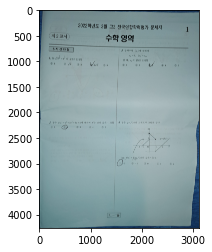

In [ ]:
from PIL import Image

pts1 = np.float32([itpoint_1, itpoint_2, itpoint_4, itpoint_3])

w1 = abs(itpoint_1[0] - itpoint_2[0])
w2 = abs(itpoint_3[0] - itpoint_4[0])
h1 = abs(itpoint_1[1] - itpoint_3[1])
h2 = abs(itpoint_2[1] - itpoint_4[1])
width = max([w1, w2])
height = max([h1, h2])

pts2 = np.float32([[0,0], [width-1, 0], [width-1, height-1], [0, height-1]])

mtrx = cv2.getPerspectiveTransform(pts1, pts2)

result = cv2.warpPerspective(im, mtrx, (int(width), int(height)))
plt.imshow(result)
save = Image.fromarray(result, 'RGB')
save.save("/content/drive/MyDrive/Colab_Notebooks/test_scoring/1_cut_paper/perspectival_img.jpg")

## 4. 실제 활용

In [ ]:
# 모델 정의
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file('COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml'))
cfg.DATASETS.TRAIN = ("test_paper_train",)
cfg.DATASETS.TEST = () 
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.02
cfg.SOLVER.MAX_ITER = 300 
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1

# 훈련된 가중치로 예측기 만들기
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7
cfg.DATASETS.TEST = ("test_paper_test", )
predictor = DefaultPredictor(cfg)

[05/19 14:51:54 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                                  | Shapes                                          |
|:------------------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*               | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.bottom_up.res2.0.conv2.*               | backbone.bottom_up.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| backbone.bottom_up.res2.0.conv3.*               | backbone.bottom_up.res2.0.conv3.{norm.bia

In [ ]:
from PIL import Image

# 결과 예측
def predict(img_path, n):
  im = cv2.imread(img_path)
  outputs = predictor(im)

  ins = outputs["instances"]

  pred_masks = ins.get_fields()["pred_masks"]
  
  # 테두리 좌표 조사
  # A / B 행렬에 넣기
  upA = np.empty((0,2), int)
  upB = np.array([])
  rightA = np.empty((0,2), int)
  rightB = np.array([])
  leftA = np.empty((0,2), int)
  leftB = np.array([])
  downA = np.empty((0,2), int)
  downB = np.array([])

  for i in range(0, pred_masks.size()[1],2):
    for j in range(0, pred_masks.size()[2],2):

      # 만약 '종이'가 있는 위치라면
      if(pred_masks[0][i][j] == True):

        # 만약 '종이'가 위엔 없고 아래에는 있다면
        if (pred_masks[0][i-1][j] == False and pred_masks[0][i+1][j] == True):
          # ?
          if(len(upA) == 0 or upA[-1][0] == j):
            upA = np.append(upA, np.array([[j, 1]]), axis=0)
            upB = np.append(upB, np.array([i]))
            continue

          # ?
          if(abs((upB[-1] - i) / (upA[-1][0] - j)) < 3):
            upA = np.append(upA, np.array([[j, 1]]), axis=0)
            upB = np.append(upB, np.array([i]))

            # ?
            if(len(upA) == 1):
              upA.pop(0)
              upB.pop(0)

        # 만약 '종이'가 오른쪽엔 없고 왼쪽엔 있다면
        elif (pred_masks[0][i][j+1] == False and pred_masks[0][i][j-1] == True):
          # ?
          if(len(rightA) == 0 or rightA[-1][0] == j):
            rightA = np.append(rightA, np.array([[j, 1]]), axis=0)
            rightB = np.append(rightB, np.array([i]))
            continue

          # ?
          if(abs((rightB[-1] - i )/ (rightA[-1][0] - j)) > 6):
            rightA = np.append(rightA, np.array([[j, 1]]), axis=0)
            rightB = np.append(rightB, np.array([i]))
          
            # ?
            if(len(rightA) == 1):
              rightA.pop(0)
              rightB.pop(0)
        
        # 만약 '종이'가 왼쪽엔 없고 오른쪽엔 있다면
        elif (pred_masks[0][i][j-1] == False and pred_masks[0][i][j+1] == True):
          # ?
          if(len(leftA) == 0 or leftA[-1][0] == j):
            leftA = np.append(leftA, np.array([[j, 1]]), axis=0)
            leftB = np.append(leftB, np.array([i]))
            continue
        
          # ?
          if(abs((leftB[-1] - i )/ (leftA[-1][0] - j)) > 6):
            leftA = np.append(leftA, np.array([[j, 1]]), axis=0)
            leftB = np.append(leftB, np.array([i]))

            # ?
            if (len(leftA) == 1):
              leftA.pop(0)
              leftB.pop(0)

        # 만약 '종이'가 아래엔 없고 위엔 있다면
        elif (pred_masks[0][i+1][j] == False and pred_masks[0][i-1][j] == True):
          # ?
          if(len(downB) == 0 or downA[-1][0] == j):
            downA = np.append(downA, np.array([[j, 1]]), axis=0)
            downB = np.append(downB, np.array([i]))
            continue
      
          # ?
          if(abs((downB[-1] - i )/ (downA[-1][0] - j)) < 3):
            downA = np.append(downA, np.array([[j, 1]]), axis=0)
            downB = np.append(downB, np.array([i]))

            # ?
            if(len(downA) == 1):
              downA.pop(0)
              downB.pop(0)

  # 기울기 & Y절편
  X_up = np.linalg.inv(upA.T.dot(upA)).dot(upA.T).dot(upB)
  X_right = np.linalg.inv(rightA.T.dot(rightA)).dot(rightA.T).dot(rightB)
  X_left = np.linalg.inv(leftA.T.dot(leftA)).dot(leftA.T).dot(leftB)
  X_down = np.linalg.inv(downA.T.dot(downA)).dot(downA.T).dot(downB)

  # 좌측상단의 꼭짓점
  upandleftA = np.array([[-X_up[0], 1], [-X_left[0], 1]])
  upandleftB = np.array([X_up[1], X_left[1]])
  itpoint_1 = np.linalg.solve(upandleftA,upandleftB)

  if(itpoint_1[0] < 0):
    itpoint_1[0] = 0
  if(itpoint_1[1] < 0):
    itpoint_1[1] = 0

  # 우측상단의 꼭짓점
  upandrightA = np.array([[-X_up[0], 1], [-X_right[0], 1]])
  upandrightB = np.array([X_up[1], X_right[1]])
  itpoint_2 = np.linalg.solve(upandrightA,upandrightB)

  if(itpoint_2[0] > pred_masks.size()[2]):
    itpoint_2[0] = pred_masks.size()[2]
  if(itpoint_2[1] < 0):
    itpoint_2[1] = 0

  # 좌측하단의 꼭짓점
  downandleftA = np.array([[-X_down[0], 1], [-X_left[0], 1]])
  downandleftB = np.array([X_down[1], X_left[1]])
  itpoint_3 = np.linalg.solve(downandleftA,downandleftB)

  if(itpoint_3[0] < 0):
    itpoint_3[0] = 0
  if(itpoint_3[1] > pred_masks.size()[1]):
    itpoint_3[1] = pred_masks.size()[1]

  # 우측하단의 꼭짓점
  downandrightA = np.array([[-X_down[0], 1], [-X_right[0], 1]])
  downandrightB = np.array([X_down[1], X_right[1]])
  itpoint_4 = np.linalg.solve(downandrightA,downandrightB)

  if(itpoint_4[0] > pred_masks.size()[2]):
    itpoint_4[0] = pred_masks.size()[2]
  if(itpoint_4[1] > pred_masks.size()[1]):
    itpoint_4[1] = pred_masks.size()[1]

  # 이미지 관점 변환
  pts1 = np.float32([itpoint_1, itpoint_2, itpoint_4, itpoint_3])

  w1 = abs(itpoint_1[0] - itpoint_2[0])
  w2 = abs(itpoint_3[0] - itpoint_4[0])
  h1 = abs(itpoint_1[1] - itpoint_3[1])
  h2 = abs(itpoint_2[1] - itpoint_4[1])
  width = max([w1, w2])
  height = max([h1, h2])

  pts2 = np.float32([[0,0], [width-1, 0], [width-1, height-1], [0, height-1]])

  mtrx = cv2.getPerspectiveTransform(pts1, pts2)

  # 결과 저장
  result = cv2.warpPerspective(im, mtrx, (int(width), int(height)))
  save = Image.fromarray(result, 'RGB')
  save.save("/content/drive/MyDrive/Sample/perspectival_img_{}.jpg".format(n))

In [ ]:
from glob import glob
import os

path = '/content/drive/MyDrive/Img/20220411_201651.jpg'
predict(path, 1)

# paths = glob(os.path.join('/content/drive/MyDrive/Sample', '*.jpg'))
# excluded = glob(os.path.join('/content/drive/MyDrive/Colab_Notebooks/test_scoring/1_cut_paper/cut_paper', '*.jpg'))

# for i in range(len(paths)):
#   predict(paths[i], i)

# s = excluded[-1]
# s = s.split('/')
# s = s[-1]
# s = s.split('_')
# s = s[-1]
# s = s[:-4]
# cnt = int(s) + 1

# for i in range(cnt, len(paths)):
#   predict(paths[i], i)

KeyboardInterrupt: ignored